# Interpretability analysis of the CNN or architecture

## 0. Settings

In [1]:
# Libraries
import torch
import torch.nn.functional as F

from PIL import Image

import sys
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import pandas as pd

import torchvision
from torchvision import models
from torchvision import transforms

from captum.attr import Saliency
from captum.attr import IntegratedGradients
from captum.attr import GradientShap
from captum.attr import Occlusion
from captum.attr import NoiseTunnel
from captum.attr import visualization as viz
from captum.attr import FeatureAblation
from captum.attr import GuidedGradCam

from captum.robust import FGSM
from captum.robust import PGD
from captum.robust import MinParamPerturbation

from ffcv.loader import OrderOption
from ffcv.loader import Loader
from ffcv.fields.decoders import BytesDecoder, NDArrayDecoder
from ffcv.transforms import ToTensor, ToDevice

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

from sklearn.manifold import TSNE # for t-SNE dimensionality reduction


from configuration_dict import train_configuration_default
from datasets import NormalisePatientDate
import network_interpretability
import network_interpretability_tsne

/opt/conda/envs/ffcv/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Constants
PATH_TO_NETWORK = "saved_networks/cnn_and_pat_test/29_0.16000000000000003.pt"# "saved_networks/best_cnn_and_pat.pt"
PATH_TO_DATA = 'beton_files/test_data.beton'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device == "cuda":
    torch.cuda.empty_cache()
print(device)

cuda


## 1. Define useful functions (network, data & display)

In [3]:
def load_state_dict_pretrained_to_net(self, state_dict):
    # from https://discuss.pytorch.org/t/how-to-load-part-of-pre-trained-model/1113
 
    state_dict = torch.load(state_dict)

    own_state = self.state_dict()
    for name, param in state_dict.items():
        if name not in own_state:
             continue
        if isinstance(param, torch.nn.parameter.Parameter):
            # backwards compatibility for serialized parameters
            param = param.data
        try:
            own_state[name].copy_(param)
        except RuntimeError as e:
            print("State dict {} from pretrained cannot be loaded into new network (network.py).\nError: {}".format(name, e))

def get_net(device="cuda", level="total", two_neur_output=True, tsne=False, patient_data=None):
    train_configuration = train_configuration_default
    if not tsne:
        train_configuration["network_class"] = network_interpretability.MiPredArteryLevel_Or_with_patient
    else:
        train_configuration["network_class"] = network_interpretability_tsne.MiPredArteryLevel_Or_with_patient
    train_configuration["dropout"] = 0.0
    train_configuration["batch_size"] = 1 # get images 1 by 1
    if not tsne:
        net = train_configuration["network_class"](train_configuration, two_neur_output, 
                                                   artery_only_level=(level!="total"), patient_data=patient_data)
    else:
        net = train_configuration["network_class"](train_configuration, two_neur_output, 
                                                   artery_only_level=(level!="total"), patient_data=patient_data)
        
    load_state_dict_pretrained_to_net(net, PATH_TO_NETWORK)
    
    if level=="total":
        net.to(device)
    elif level=="LAD":
        net = net.resnet_lad
        net.to(device)
    elif level=="LCX":
        net = net.resnet_lcx
        net.to(device)
    elif level=="RCA":
        net = net.resnet_rca
        net.to(device)
    
    return net

In [4]:
def display_img(data, level="total", name_of_method="Input image"):
    data = data.cpu()
    
    if level=="total":
        fig, axs = plt.subplots(3, 4, figsize=(20,10))
    else:
        fig, axs = plt.subplots(1, 4, figsize=(20,3.33))
        
    for i_art, art in enumerate(["LAD", "LCX", "RCA"]):
        if art==level or level=="total":
            for i_view, view in enumerate(["1", "2"]):
                for i_type, type in enumerate(["image", "mask"]):
                    if level == "total":
                        img = data[0,i_art,i_view,i_type,:,:].numpy()
                        axs[i_art, i_view*2+i_type].imshow(img, cmap="gray")
                        axs[i_art, i_view*2+i_type].set_title("{}: view {}".format(art, view))
                        axs[i_art, i_view*2+i_type].axis("off")
                    else:
                        img = data[0,i_view,i_type,:,:].numpy()
                        axs[i_view*2+i_type].imshow(img, cmap="gray")
                        axs[i_view*2+i_type].set_title("{}: view {}".format(art, view))
                        axs[i_view*2+i_type].axis("off")
                            
    fig.suptitle(name_of_method, fontsize=20)
    plt.show()

In [5]:
def get_datapoint(mi_pos=None, device="cuda", level="total", two_neur_output=True, display=False, index=None): 
    data_loader = Loader(PATH_TO_DATA,
        batch_size=1,
        num_workers=os.cpu_count(),
        order=OrderOption.SEQUENTIAL,
        pipelines={
          'images': [NDArrayDecoder(), ToTensor(), ToDevice(device, non_blocking=True)],
          'patient_data': [NDArrayDecoder(), ToTensor(), NormalisePatientDate(True), ToDevice(device, non_blocking=True)],
          'label': [BytesDecoder(), ToTensor(), ToDevice(device, non_blocking=True)]
        },    
        batches_ahead=10,
        recompile=True
    )
    
    for idx, (data, patient_data, target) in enumerate(data_loader):
        if index is not None and index==idx: # if given index, just take this one
            # print("Index {} reached".format(idx))
            # print("Full target: {}".format(target))
            data, target = data, target
            break
        elif index is None and (mi_pos is None or target[0][mi_pos]): # else look at the condition on mi  
            # print("Index {} reached".format(idx))
            # print("Full target: {}".format(target))
            data, target = data, target
            break
            
    if level=="total":
        if two_neur_output:
            target = int(target[0][-1].item())
        else:
            target = (torch.ones(1,1)*target[0][-1]).cuda()
    
    if level=="LAD":
        if two_neur_output:
            target =int(target[0][0].item())
        else:
            target = (torch.ones(1,1)*target[0][0]).cuda()
            
        data = data[:,0,:,:,:]
            
    elif level=="LCX":
        if two_neur_output:
            target =int(target[0][1].item())
        else:
            target = (torch.ones(1,1)*target[0][1]).cuda()
            
        data = data[:,1,:,:,:]
            
    elif level=="RCA":
        if two_neur_output:
            target =int(target[0][2].item())
        else:
            target = (torch.ones(1,1)*target[0][2]).cuda()
            
        data = data[:,2,:,:,:]
               
    if display:
        display_img(data, level=level)
    
    data.requires_grad_()
    
    del data_loader
    
    return data, patient_data, target

In [6]:
def display_result(data, result, name_of_method="", result_min_value=None, divide_by_max=False, level="total"):
    data = data.detach().cpu()
    result = result.detach().cpu()
    
    if level=="total":
        fig, axs = plt.subplots(3, 4, figsize=(20,10))
    else:
        fig, axs = plt.subplots(1, 4, figsize=(20,3.33))

    for i_art, art in enumerate(["LAD", "LCX", "RCA"]):
        if art==level or level=="total":
            for i_view, view in enumerate(["1", "2"]):
                for i_type, type in enumerate(["image", "mask"]):
                    if level == "total":
                        img = data[0,i_art,i_view,i_type,:,:].numpy()
                        result_img = result[0,i_art,i_view,i_type,:,:].numpy()
                    else:
                        img = data[0,i_view,i_type,:,:].numpy()
                        result_img = result[0,i_view,i_type,:,:].numpy()
                        
                    if divide_by_max:
                        if np.max(result_img) > 0:
                            result_img = result_img/np.max(result_img)
                            
                    result_img = np.ma.masked_where(result_img == 0, result_img)
                    
                    if result_min_value is not None:
                        result_img = np.ma.masked_where(result_img < result_min_value, result_img)
                    
                    if level == "total":
                        axs[i_art, i_view*2+i_type].imshow(img, cmap="gray")
                        im = axs[i_art, i_view*2+i_type].imshow(result_img, interpolation='none', alpha=0.8, cmap="jet")
                        axs[i_art, i_view*2+i_type].set_title("{} of {}: view {}".format(type, art, view))
                        fig.colorbar(im, ax=axs[i_art, i_view*2+i_type], fraction=0.046, pad=0.04)
                        axs[i_art, i_view*2+i_type].axis("off")
                    else:
                        axs[i_view*2+i_type].imshow(img, cmap="gray")
                        im = axs[i_view*2+i_type].imshow(result_img, interpolation='none', alpha=0.8, cmap="jet")
                        axs[i_view*2+i_type].set_title("{} of {}: view {}".format(type, art, view))
                        fig.colorbar(im, ax=axs[i_view*2+i_type], fraction=0.046, pad=0.04)
                        axs[i_view*2+i_type].axis("off")
                    
    fig.suptitle("{} on CNN".format(name_of_method), fontsize=20)
    plt.show()

In [7]:
def get_all(level, mi_pos, display, two_neur_output, idx=None, tsne=False):
    data, patient_data, target = get_datapoint(mi_pos=mi_pos, device="cuda", level=level, display=display, 
                                               two_neur_output=two_neur_output, index=idx)
    
    train_configuration = {}
    train_configuration["dropout_patient_net"] = 0.0
    train_configuration["batch_size"] = 1 # get images 1 by 1
    train_configuration["nb_neur_per_hidden_layer_patient"] = [50,10]
    train_configuration["batch_norm_patient"] = False
    
    patient_net = network_interpretability.PatientNet(train_configuration).cuda()
    load_state_dict_pretrained_to_net(patient_net, PATH_TO_NETWORK)
    x_p = patient_net(patient_data)
    
    x_p = x_p.cuda()
    
    net = get_net(device="cuda", level=level, two_neur_output=two_neur_output, patient_data=x_p, tsne=tsne)
    net.cuda()
    if not tsne:
        prediction = net(data).cpu().detach().numpy()[0]
        # print("MI prediction is {} and true label is {}".format(prediction, target))
    else:
        prediction = None
        
    del train_configuration, patient_net, x_p
    
    return net, data, patient_data, target, prediction

## 2. Gradient related

We are looking for one MI correctly classified and one wrongly classified

In [9]:
data_loader = Loader(PATH_TO_DATA,
    batch_size=1,
    num_workers=os.cpu_count(),
    order=OrderOption.SEQUENTIAL,
    pipelines={
      'images': [NDArrayDecoder(), ToTensor(), ToDevice(device, non_blocking=True)],
      'patient_data': [NDArrayDecoder(), ToTensor(), NormalisePatientDate(True), ToDevice(device, non_blocking=True)],
      'label': [BytesDecoder(), ToTensor(), ToDevice(device, non_blocking=True)]
    },    
    batches_ahead=10,
    recompile=True
)

for idx, (data, patient_data, target) in enumerate(data_loader):
    if target[0][-1]:
        print(idx, target)

21 tensor([[0., 0., 1., 1.]])
35 tensor([[1., 0., 0., 1.]])
43 tensor([[1., 1., 0., 1.]])
44 tensor([[1., 1., 1., 1.]])
58 tensor([[0., 0., 1., 1.]])


In [17]:
import pandas as pd
pd.read_csv("beton_files/test_data.csv").iloc[43]

patient_name               patient3
mi_lad                            1
mi_lcx                            1
mi_rca                            0
patient_mi                        1
sjid                    078-214-009
sex                               0
age                       53.200001
bmi                       23.700001
diabetes_hist                     0
smoking_bln                       1
hypertension_hist                 0
cholesterolemia_hist            1.0
prev_CVD                          0
eGFR_bln                  80.283264
resuscitation                   0.0
chf_code_proc                   0.0
lvef_comb                      55.0
grace_calc                    122.0
death_mi                      False
time_to_death_mi                 -1
mi                             True
nb_mi                             1
time_to_mi                   2560.0
revasc                        False
nb_revasc                         0
time_to_revasc                 -1.0
Name: 43, dtype: object

In [18]:
df = pd.read_csv("df_patient_names_to_sjid.csv")
df["patient_name"] = df["patient_name"].str[7:].astype(int)
df = df.set_index(["patient_name"])
df.loc[3]

patient_sjid    078-214-009
Name: 3, dtype: object

### 2.1 Saliency

Gradient of the image output against input

In [36]:
level_to_consider="LAD" # total, LAD, LCX or RCA
mi_pos = None # None, 0, 1, 2, 3
display = False # True or False
two_neur_output = True # True or false

net, data, patient_data, target, prediction = get_all(level_to_consider, mi_pos, display, two_neur_output=two_neur_output, idx=0)

89
Index 0 reached
Full target: tensor([[0., 0., 0., 0.]])


Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


MI prediction is [0.67939126 0.3206087 ] and true label is 0


In [46]:
saliency = Saliency(net)
grads = saliency.attribute(data, target=target)

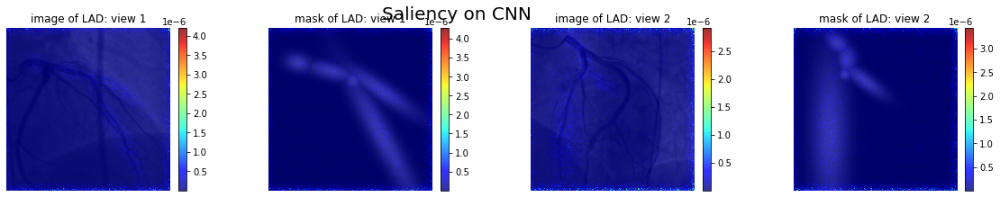

In [48]:
display_result(data, grads, name_of_method="Saliency", result_min_value=None, divide_by_max=False, level=level_to_consider)

### 2.2 Integrated gradient

Add part of information one per one from a void baseline and look at how it influence the prediction

In [39]:
level_to_consider="total" # total, LAD, LCX or RCA
mi_pos = None # None, 0, 1, 2, 3
display = False # True or False
two_neur_output = True # True or false

net, data, patient_data, target, prediction = get_all(level_to_consider, mi_pos, display, two_neur_output=two_neur_output)

Index 0 reached
Full target: tensor([[0., 0., 0., 0.]])


Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


MI prediction is [0.55275136 0.44724864] and true label is 0


In [40]:
### !!! HERE RUNNING ON THE LIMITS OF THE MEMORY --> KILL ALL OTHER PROCESSES BEFORE !!! ###
ig = IntegratedGradients(net)
grads = ig.attribute(data, target=target, internal_batch_size=1)

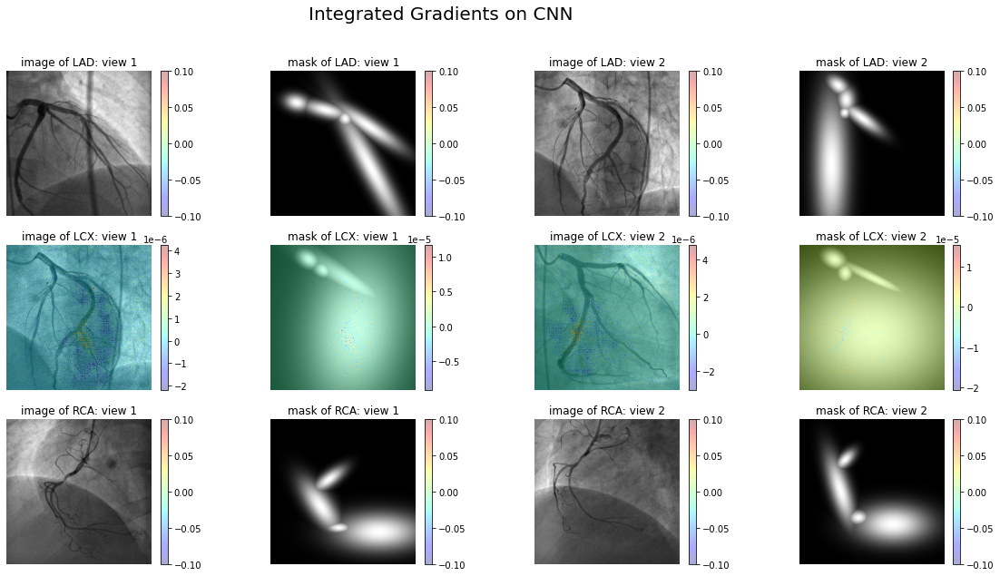

In [41]:
display_result(data, grads, name_of_method="Integrated Gradients", divide_by_max=False, level=level_to_consider)

In [42]:
# Free memory for next runs
del ig
del grads

### 2.3 Integrated Gradient and Noise Tunnel

Do the method with various images with gaussian noise and show the IG based on the mean of them

In [43]:
level_to_consider="total" # total, LAD, LCX or RCA
mi_pos = None # None, 0, 1, 2, 3
display = False # True or False
two_neur_output = True # True or false

net, data, patient_data, target, prediction = get_all(level_to_consider, mi_pos, display, two_neur_output=two_neur_output)

Index 0 reached
Full target: tensor([[0., 0., 0., 0.]])


Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


MI prediction is [0.5877527  0.41224733] and true label is 0


In [44]:
### !!! HERE RUNNING ON THE LIMITS OF THE MEMORY --> KILL ALL OTHER PROCESSES BEFORE !!! ###
ig = IntegratedGradients(net)
nt = NoiseTunnel(ig)
grads = nt.attribute((data, patient_data), target=target, internal_batch_size=1, nt_type='smoothgrad_sq', nt_samples_batch_size=1,
                     nt_samples=5, stdevs=0.2, baselines=data * 0)

AssertionError: Input and baseline must have the same dimensions, baseline has 1 features whereas input has 2.

In [ ]:
display_result(data, grads, name_of_method="Integrated Gradients with Noise Tunnel", 
               divide_by_max=True, level=level_to_consider, result_min_value=0.01)

In [ ]:
del net, data, target, prediction
del ig, nt, grads

### 2.4 Gradient Shap

Gradient SHAP adds Gaussian noise to each input sample multiple times, selects a random point along the path between baseline and input, and computes the gradient of outputs with respect to those selected random points. The final SHAP values represent the expected value of gradients * (inputs - baselines).

The computed attributions approximate SHAP values under the assumptions that the input features are independent and that the explanation model is linear between the inputs and given baselines.

Negative --> lower the pred, positive --> higher the prediction

In [71]:
level_to_consider="total" # total, LAD, LCX or RCA
mi_pos = None # None, 0, 1, 2, 3
display = False # True or False
two_neur_output = True # True or false

net, data, patient_data, target, prediction = get_all(level_to_consider, mi_pos, display, two_neur_output=two_neur_output)

Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


Index 0 reached
Full target: tensor([[0., 0., 0., 0.]])
torch.Size([1, 2, 1524, 1524])
torch.Size([1, 2, 1524, 1524])
torch.Size([1, 2, 1524, 1524])
torch.Size([1, 2, 1524, 1524])
torch.Size([1, 2, 1524, 1524])
torch.Size([1, 2, 1524, 1524])
MI prediction is [0.59300184 0.40699816] and true label is 0


In [72]:
gs = GradientShap(net)
grads = gs.attribute((data, patient_data), target=target, baselines=data * 0, n_samples=1)

AssertionError: Input and baseline must have the same dimensions, baseline has 1 features whereas input has 2.

In [ ]:
display_result(data, grads, name_of_method="Gradient Shap", level=level_to_consider)

In [42]:
del net, data, target, prediction
del gs, grads

### 2.5 GradCAM

<span style="color:red">Not working with Captum (issues with the ReLU inplace in ResNet18)</span> https://github.com/pytorch/captum/issues/378 (not working for me)

<span style="color:red">New library not implemented for multiple input --> common attention on both images and masks</span> https://github.com/raghakot/keras-vis/issues/33

Index 0 reached
Full target: tensor([[0., 0., 0., 0.]])


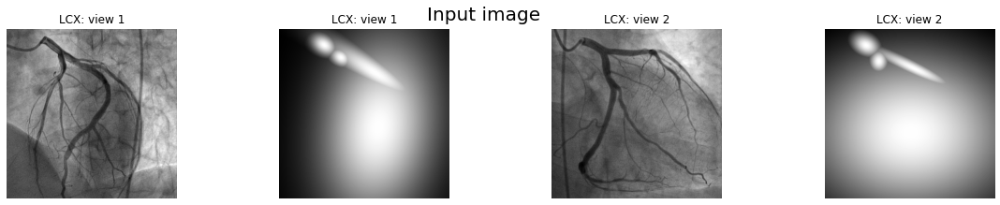

Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


MI prediction is [0.5838156  0.41618443] and true label is 0


In [54]:
level_to_consider= "LCX" # total, LAD, LCX or RCA
mi_pos = None # None, 0, 1, 2, 3
display = True # True or False
two_neur_output = True # True or false

if level_to_consider=="total":
    print("GradCam works with last CNN layer, which doesn't exist at the end of the common network please use a subnetwork and not the full network.")
    sys.exit()

net, data, patient_data, target, prediction = get_all(level_to_consider, mi_pos, display, two_neur_output=two_neur_output)

In [55]:
target_layers = [net.resnet18_without_head[-1][1].conv2]

In [56]:
cam = GradCAM(model=net, target_layers=target_layers)

In [57]:
torch.autograd.set_detect_anomaly(True)
res_cam = cam(input_tensor=data)

In [58]:
res_cam_msk = np.repeat(res_cam[:, np.newaxis, :, :,], 2, axis=1)
res_cam_view = np.repeat(res_cam_msk[:, np.newaxis, :, :,], 2, axis=1)
res_cam_tensor = torch.as_tensor(res_cam_view)

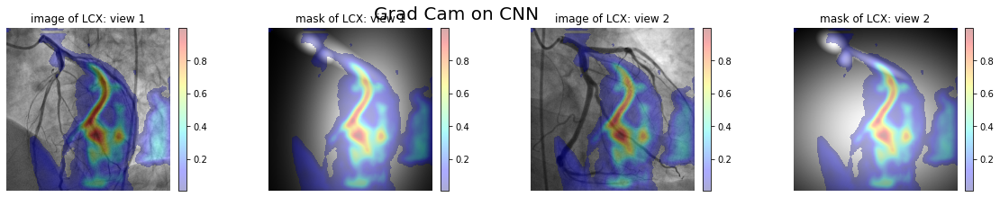

In [59]:
display_result(data, res_cam_tensor, name_of_method="Grad Cam", level=level_to_consider, result_min_value=0.01)

## 3. Input alteration

### 3.1 Occlusion

Important ones have positive value

In [45]:
level_to_consider="total" # total, LAD, LCX or RCA
mi_pos = None # None, 0, 1, 2, 3
display = False # True or False
two_neur_output = True

net, data, patient_data, target, prediction = get_all(level_to_consider, mi_pos, display, two_neur_output=two_neur_output)

Index 0 reached
Full target: tensor([[0., 0., 0., 0.]])


Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


MI prediction is [0.56739163 0.43260834] and true label is 0


In [46]:
shape_side = 512
stride = 512

if level_to_consider=="total":
    strides = (1, 1, 1, stride, stride)
    sliding_window_shapes=(1, 1, 1, shape_side, shape_side)
else:
    strides = (1, 1, stride, stride)
    sliding_window_shapes=(1, 1, shape_side, shape_side)

occlusion = Occlusion(net)
results = occlusion.attribute(data,
                           strides = strides,
                           target=target,
                           sliding_window_shapes=sliding_window_shapes,
                           baselines=0)

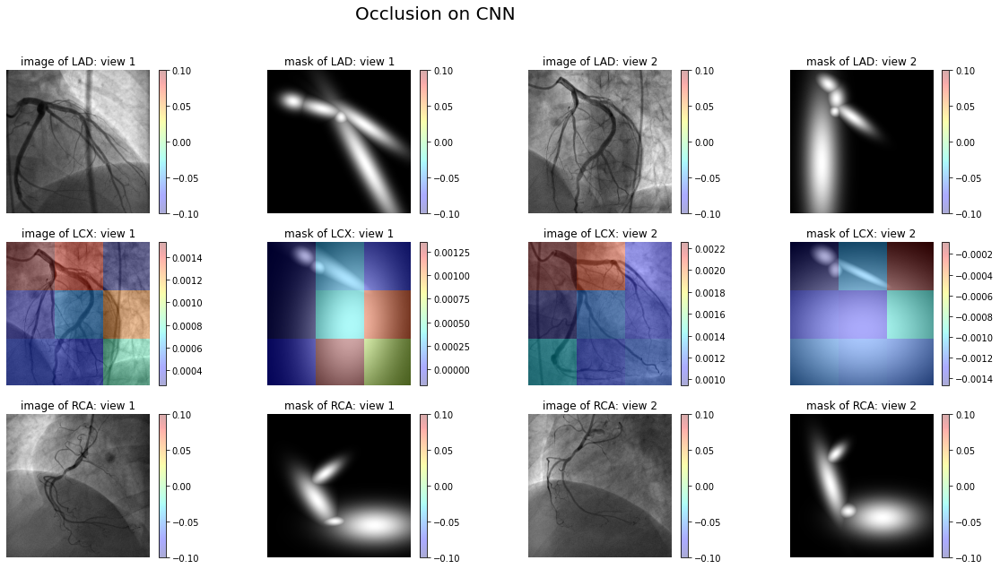

In [47]:
display_result(data, results, name_of_method="Occlusion", level=level_to_consider)

### 3.2 Robustness

#### 3.2.1 Image alteration

Idea: take some interesting and correctly working cases and alter them

#### 3.2.1.1 FGSM

Index 0 reached
Full target: tensor([[0., 0., 0., 0.]])


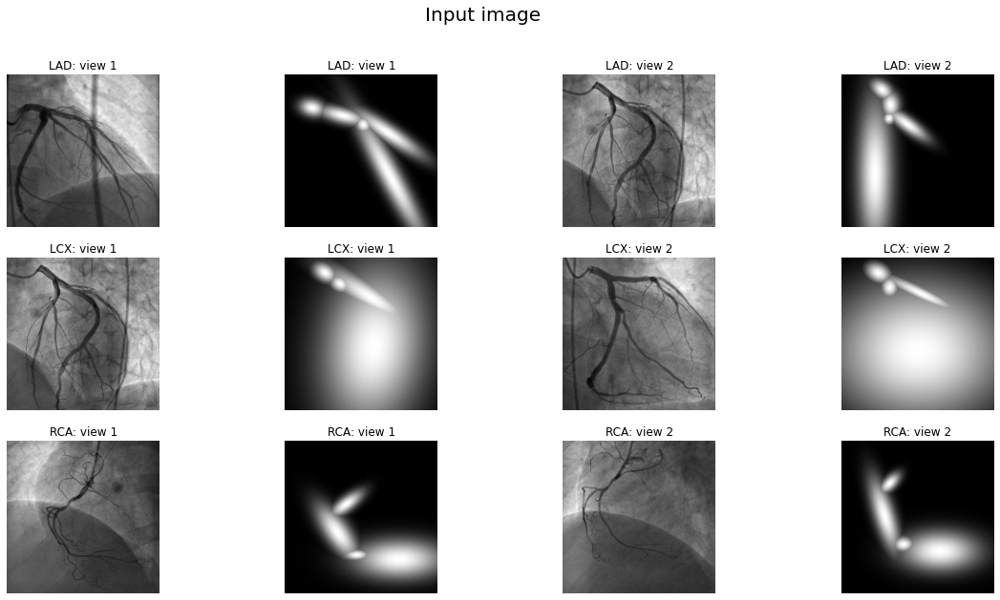

Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


MI prediction is [0.59886515 0.40113488] and true label is 0


In [48]:
level_to_consider="total" # total, LAD, LCX or RCA
mi_pos = None # None, 0, 1, 2, 3
display = True # True or False
two_neur_output = True

net, data, patient_data, target, prediction = get_all(level_to_consider, mi_pos, display, two_neur_output=two_neur_output)

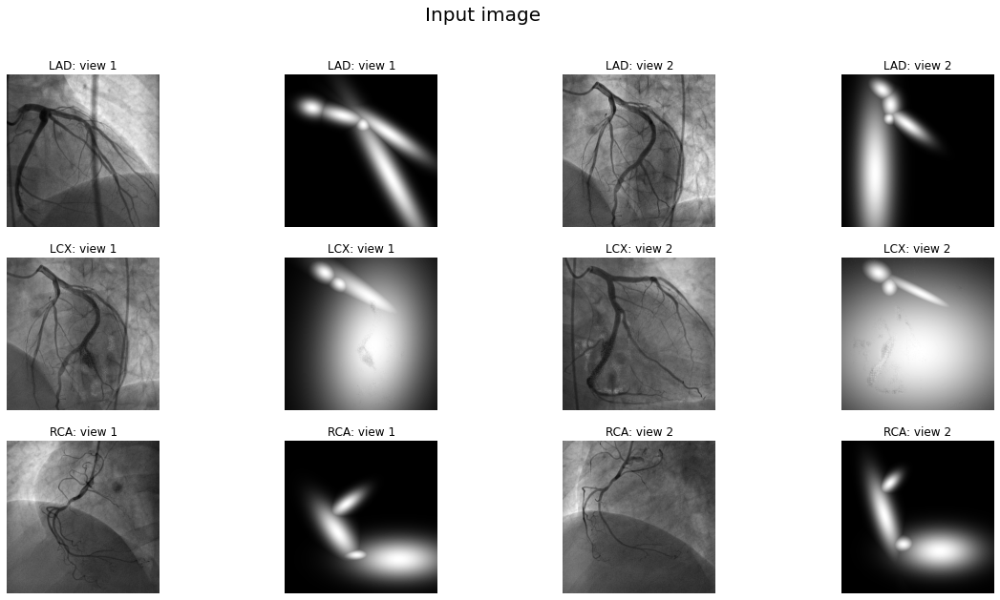

In [49]:
epsilon = 0.5

fgsm = FGSM(net, lower_bound=0.0, upper_bound=1.0)
perturbed_image_fgsm = fgsm.perturb(data, epsilon=epsilon, target=target) 
display_img(perturbed_image_fgsm.detach(), level=level_to_consider)

In [50]:
new_pred = net(perturbed_image_fgsm).cpu().detach().numpy()[0]
print("New MI prediction is {}, old one was {} and target is {}".format(new_pred, prediction, target))
print("Difference is {} towards MI".format(prediction[1]-new_pred[1]))

New MI prediction is [0.594321   0.40567902], old one was [0.59886515 0.40113488] and target is 0
Difference is -0.0045441389083862305 towards MI


#### 3.2.1.2 PGD

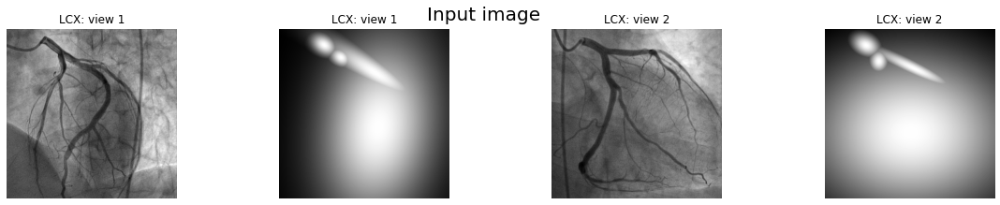

Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


In [25]:
level_to_consider="LCX" # total, LAD, LCX or RCA
mi_pos = None # None, 0, 1, 2, 3
display = True # True or False
two_neur_output = False

net, data, patient_data, target, prediction = get_all(level_to_consider, mi_pos, display, two_neur_output=two_neur_output)

/opt/conda/envs/ffcv/lib/python3.9/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


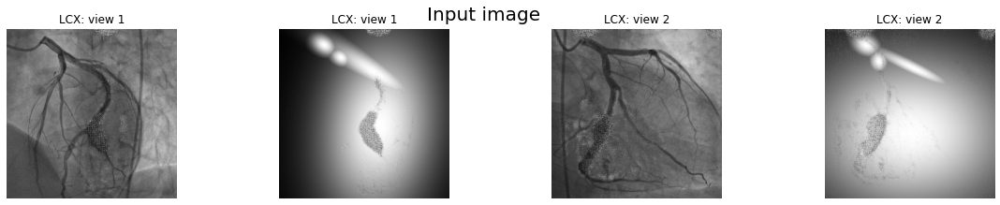

In [26]:
radius = 50.0
step_size = 0.5
step_num = 100

### HERE CHANGE TARGET https://captum.ai/api/robust.html

pgd = PGD(net, torch.nn.BCELoss(reduction='none'), lower_bound=0.0, upper_bound=1.0)
perturbed_image_pgd = pgd.perturb(inputs=data, radius=radius, step_size=step_size, 
                                  step_num=step_num, target=target)
display_img(perturbed_image_pgd.detach(), level=level_to_consider)

In [27]:
new_pred = net(perturbed_image_pgd).cpu().detach().numpy()[0][0]
print("New MI prediction is {}, old one was {} and target is {}".format(new_pred, prediction[0], target.cpu().item()))
print("Difference is {} towards MI".format((new_pred-prediction).item()))

New MI prediction is 0.43454623222351074, old one was 0.40762898325920105 and target is 0.0
Difference is 0.026917248964309692 towards MI


### 3.3 Full analysis

In [8]:
def add_to_axis(data, grads, axs, fig, row_nb, art_nb):
    for i_view, view in enumerate(["1", "2"]):
        img = data[0,i_view,0,:,:].cpu().detach().numpy()
        result_img = grads[0,i_view,0,:,:].cpu().detach().numpy()

        axs[row_nb, art_nb*2+i_view].imshow(img, cmap="gray")
        im = axs[row_nb, art_nb*2+i_view].imshow(result_img, interpolation='none', alpha=0.9, cmap="jet")
        cbar = fig.colorbar(im, ax=axs[row_nb, art_nb*2+i_view], fraction=0.046, pad=0.04)
        cbar.ax.tick_params(labelsize=15)
        
        remove_all_except_label(axs[row_nb, art_nb*2+i_view])

In [9]:
def apply_all_analysis(fig, axs, net, data, target, prediction, level_to_consider):
    idx_l = ["LAD", "LCX", "RCA"]
    art_nb = idx_l.index(level_to_consider)
    
    # Saliency
    saliency = Saliency(net)
    grads = saliency.attribute(data, target=target)
    add_to_axis(data, grads, axs, fig, 2, art_nb)
    del saliency, grads
    
    # Integrated gradient
    ig = IntegratedGradients(net)
    grads = ig.attribute(data, target=target, internal_batch_size=1)
    add_to_axis(data, grads, axs, fig, 3, art_nb)
    del ig, grads
        
    # Grad cam (only at artery level)
    target_layers = [net.resnet18_without_head[-1][1].conv2]
    cam = GradCAM(model=net, target_layers=target_layers)
    res_cam = cam(input_tensor=data)
    res_cam_msk = np.repeat(res_cam[:, np.newaxis, :, :,], 2, axis=1)
    res_cam_view = np.repeat(res_cam_msk[:, np.newaxis, :, :,], 2, axis=1)
    res_cam_tensor = torch.as_tensor(res_cam_view)
    add_to_axis(data, res_cam_tensor, axs, fig, 4, art_nb)

    del cam, res_cam, res_cam_msk, res_cam_view, res_cam_tensor
        
    # Occlusion
    shape_side,stride = 128, 128
    if level_to_consider=="total":
        strides = (1, 1, 1, stride, stride)
        sliding_window_shapes=(1, 1, 1, shape_side, shape_side)
    else:
        strides = (1, 1, stride, stride)
        sliding_window_shapes=(1, 1, shape_side, shape_side)
    occlusion = Occlusion(net)
    results = occlusion.attribute(data,
                               strides = strides,
                               target=target,
                               sliding_window_shapes=sliding_window_shapes,
                               baselines=0)
    add_to_axis(data, results, axs, fig, 5, art_nb)
    del occlusion, results
    
    # FGSM
    epsilon = 0.5
    fgsm = FGSM(net, lower_bound=0.0, upper_bound=1.0)
    perturbed_image_fgsm = fgsm.perturb(data, epsilon=epsilon, target=target)
    
    for i_view, view in enumerate(["1", "2"]):
        img = perturbed_image_fgsm[0, i_view,0,:,:].cpu().detach().numpy()
        axs[6, art_nb*2+i_view].imshow(img, cmap="gray")
        remove_all_except_label(axs[6, art_nb*2+i_view])
    diff = net(perturbed_image_fgsm).cpu().detach().numpy()[0][1] - prediction[1]
    axs[6, art_nb*2].set_title("{:.3f} towards MI".format(diff), fontsize=25)
    axs[6, art_nb*2+1].set_title("{:.3f} towards MI".format(diff), fontsize=25)
    
    del fgsm, perturbed_image_fgsm

In [10]:
def remove_all_except_label(ax):
    ax.xaxis.set_visible(False)
    plt.setp(ax.spines.values(), visible=False)
    ax.tick_params(left=False, labelleft=False)
    ax.patch.set_visible(False)
    

In [11]:
def full_data_analysis(idx):
    # Create figure
    fig, axs = plt.subplots(7, 6, figsize=(30, 35)) # largeur et hauteur
    
    net, data, patient_data, target, prediction = get_all(level="total", two_neur_output=True, 
                                                idx=idx, mi_pos=None, display=False)
    
    cols = ["LAD view 1", "LAD view 2", "LCX view 1", "LCX view 2", "RCA view 1", "RCA view 2"]
    rows = ["Image", "Mask", "Saliency", "Integrated Gradients", "GradCam", "Occlusion", "FGSM"]
    
    # Show original values
    for i_art, art in enumerate(["LAD", "LCX", "RCA"]):
        for i_view, view in enumerate(["1", "2"]):
            img = data[0,i_art,i_view,0,:,:].cpu().detach().numpy()
            axs[0, i_art*2+i_view].imshow(img, cmap="gray")
            remove_all_except_label(axs[0, i_art*2+i_view])
            
            mask = data[0,i_art,i_view,1,:,:].cpu().detach().numpy()
            axs[1, i_art*2+i_view].imshow(mask, cmap="gray")
            remove_all_except_label(axs[1, i_art*2+i_view])
            
    
    for zone in ["LAD", "LCX", "RCA"]:
        #print("On {}:".format(zone))
        net, data, patient_data, target, prediction = get_all(level=zone, two_neur_output=True, 
                                                idx=idx, mi_pos=None, display=False)
        apply_all_analysis(fig, axs, net, data, target, prediction, level_to_consider=zone)
    
    for ax, col in zip(axs[0], cols):
        ax.set_title(col, fontsize=30)
        
    for ax, row in zip(axs[:,0], rows):
        ax.set_ylabel(row, rotation=90, fontsize=30)
    
    fig.tight_layout()
    fig.savefig("interpretability_perf.svg", format="svg")
    plt.show()
    
    del net, data, patient_data, target, prediction
    

Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


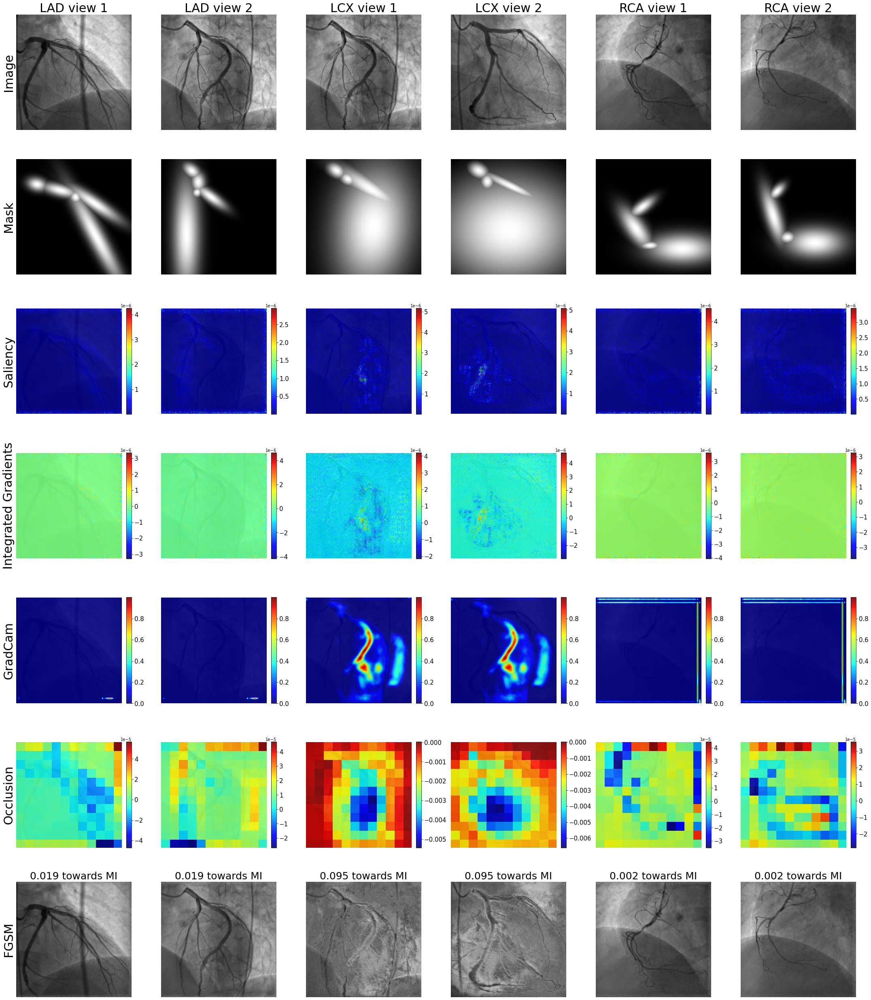

In [12]:
full_data_analysis(0)

Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


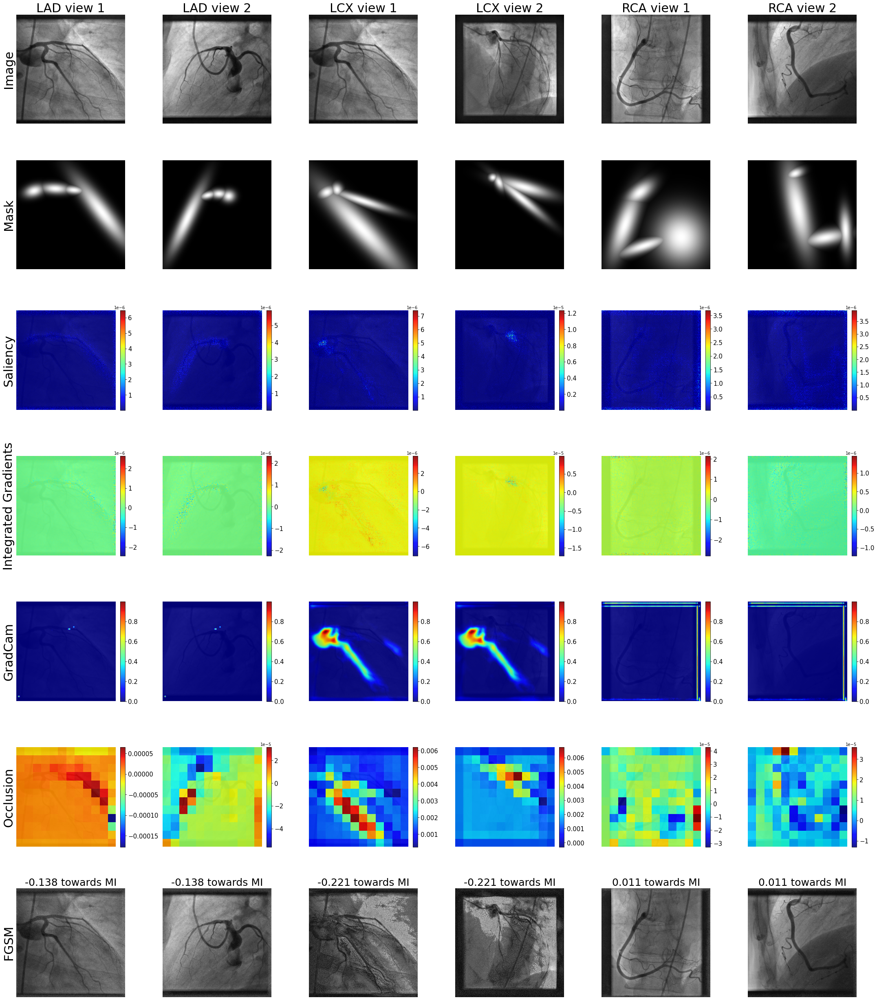

In [18]:
full_data_analysis(43) # 43

## 4. Embedding

### 4.1 TSNE

In [8]:
X = []
X_resnet6 = []
X_resnet12 = []
X_resnet18 = []
X_flatten = []
X_before_pred = []
y_pred = []
y = []


In [9]:
nb_points = 500 # if bigger than the whole dataset will take it all
start = 0


for idx in range(start, start+nb_points):
    print(idx)
        
    net, data, patient_data, target, prediction = get_all(level="total", mi_pos=None, display=False, two_neur_output=False,
                                                          tsne=True, idx=idx)
    
    pred, resnet_level6, resnet_level12, resnet_level18, flatten_level, before_pred_level = net(data)
    
    pred, resnet_level6, resnet_level12, resnet_level18, flatten_level, before_pred_level = (pred.detach().cpu().numpy()[0][0], \
                                                            resnet_level6.flatten().detach().cpu().numpy(), \
                                                            resnet_level12.flatten().detach().cpu().numpy(), \
                                                            resnet_level18.flatten().detach().cpu().numpy(), \
                                                    flatten_level.flatten().detach().cpu().numpy(), before_pred_level.flatten().detach().cpu().numpy())
    
    X.append(data[0,:,:,:,:,:].flatten().cpu().detach().numpy())
    X_resnet6.append(resnet_level6)
    X_resnet12.append(resnet_level12)
    X_resnet18.append(resnet_level18)
    X_flatten.append(flatten_level)
    X_before_pred.append(before_pred_level)
    y_pred.append(pred)
    y.append(int(target[0][-1].item()))
    
    del pred, resnet_level6, resnet_level12, resnet_level18, flatten_level, before_pred_level
    del net, data, patient_data, target, prediction
    
    torch.cuda.empty_cache()

80


Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


81


Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


82


Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


83


Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


84


Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


85


Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


86


Exception ignored in: <finalize object at 0x7f3d9822d8c0; dead>
Traceback (most recent call last):
  File "/opt/conda/envs/ffcv/lib/python3.9/weakref.py", line 591, in __call__
    return info.func(*info.args, **(info.kwargs or {}))
  File "/opt/conda/envs/ffcv/lib/python3.9/site-packages/numba/core/dispatcher.py", line 312, in finalizer
    for cres in overloads.values():
KeyError: (array(uint8, 1d, C), array(uint8, 1d, C))
Exception ignored in: <finalize object at 0x7f3d9822d7e0; dead>
Traceback (most recent call last):
  File "/opt/conda/envs/ffcv/lib/python3.9/weakref.py", line 591, in __call__
    return info.func(*info.args, **(info.kwargs or {}))
  File "/opt/conda/envs/ffcv/lib/python3.9/site-packages/numba/core/dispatcher.py", line 312, in finalizer
    for cres in overloads.values():
KeyError: (array(uint8, 1d, C), array(uint8, 1d, C))
Exception ignored in: <finalize object at 0x7f3d98e53c40; dead>
Traceback (most recent call last):
  File "/opt/conda/envs/ffcv/lib/python3.9/

87


Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0
Using cache found in /home/jovyan/.cache/torch/hub/pytorch_vision_v0.10.0


In [10]:
all_X_levels = [X, X_resnet6, X_resnet12, X_resnet18, X_flatten, X_before_pred]
titles = ["Inputs", "After 6th layer of resnet", "After 12th layer of resnet", "After 18th (last) layer of resnet", "After flattening", "Before final prediction"]

/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


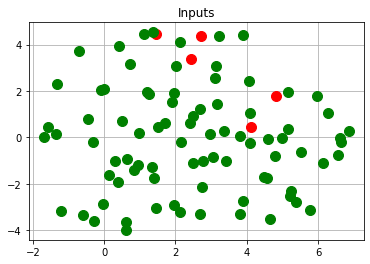

/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


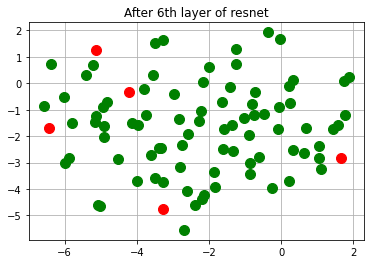

/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


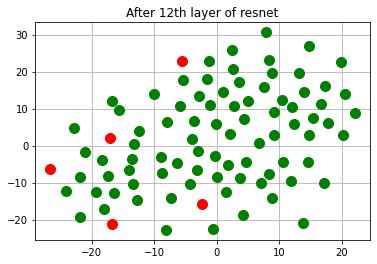

/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


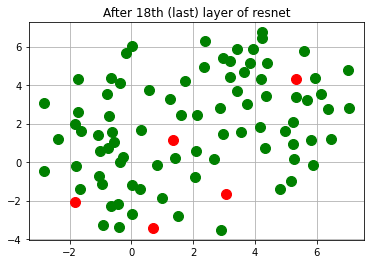

/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


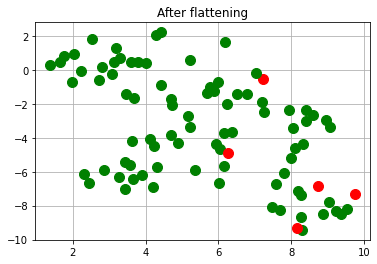

/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/conda/envs/ffcv/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


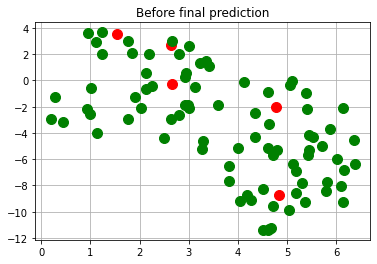

In [17]:
embed = TSNE()

for X_spec, title in zip(data, titles):
    X_embedded = embed.fit_transform(X_spec)

    plt.grid()
    for i, (x_p, y_p, y_pred_p) in enumerate(zip(X_embedded, y, y_pred)):
        if y_p==1:
            plt.plot(x_p[0], x_p[1], marker="o", markersize=10, markerfacecolor="red", markeredgecolor="red")
        elif y_p==0:
            plt.plot(x_p[0], x_p[1], marker="o", markersize=10, markerfacecolor="green", markeredgecolor="green")   
    plt.title(title)
    plt.show()

# 5. Confusion matrices

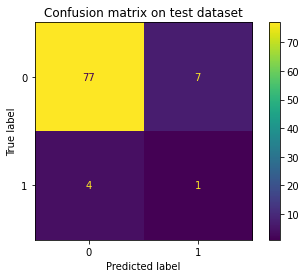

In [27]:
cm = confusion_matrix(y, np.array(y_pred)>0.5)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title("Confusion matrix on test dataset")
plt.show()

In [29]:
from sklearn.metrics import f1_score
f1_score(y, np.array(y_pred)>0.5)

0.15384615384615385

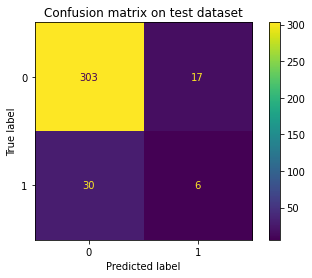

In [31]:
cm = confusion_matrix(y, np.array(y_pred)>0.5)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title("Confusion matrix on test dataset")
plt.show()

In [32]:
from sklearn.metrics import f1_score
f1_score(y, np.array(y_pred)>0.5)

0.20338983050847456

----